# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import matplotlib.pyplot as plt

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path

from drvi_notebooks.utils.data.adata_plot_pp import make_balanced_subsample
from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.latent import set_optimal_ordering

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()
cwd

'/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/drvi_notebooks/analysis'

In [8]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [9]:
(proj_dir / 'plots' / 'zebrafish_ablation_hvg').mkdir(parents=True, exist_ok=True)

In [10]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [11]:
run_name = 'zebrafish_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Data

In [13]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 462243 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell', 'sample', 'method', 'nUMI', 'nGene', 'percent.mt', 'percent.ribo', 'nUMI_MS', 'MS_Seurat', 'MS_SNR', 'original.top.clust', 'stage.integer', 'stage.group', 'tissue_x', 'clust', 'tissue.figure', 'tissue.name', 'persistence.avg.stage.diff', 'persistence.group', 'cell.cycle.g1s', 'cell.cycle.g2m', 'cell.cycle.class', 'num', 'tissue.subsets', 'tissue_y', 'identity.super', 'identity.sub', 'identity.super.short', 'identity.sub.short', 'zfin', 'daniocell.cluster', 'clust.collapse', 'ident.gene.1', 'ident.gene.2', 'ident.gene.3', 'roc.1', 'roc.2', 'roc.3', 'roc.4', 'roc.5', 'roc.6', 'wilcox.1', 'wilcox.2', 'wilcox.3', 'wilcox.4', 'wilcox.5', 'wilcox.6', 'remove', 'identity.combined'
    var: 'features', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'stage.group_colors', 'tissue.name_colors', 'umap'
    ob

## Runs to load

In [14]:
run_info = get_run_info_for_dataset('zebrafish_hvg_ablation')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [15]:
embeds = {}
random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    print(method_name)
    embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    set_optimal_ordering(embed, key_added='optimal_var_order')    
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

32 Dimensional
64 Dimensional
128 Dimensional
256 Dimensional
512 Dimensional
1024 Dimensional
2048 Dimensional


32 Dimensional


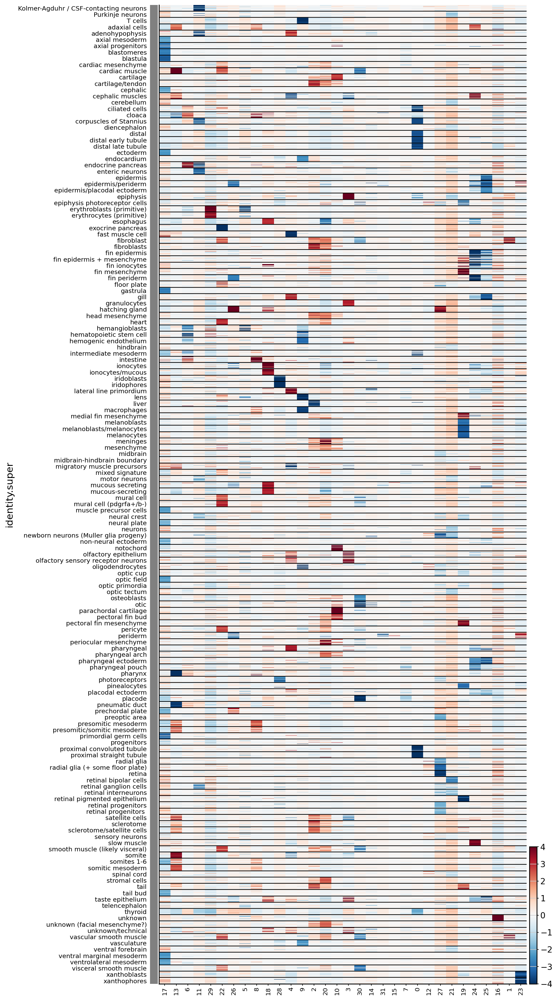

64 Dimensional


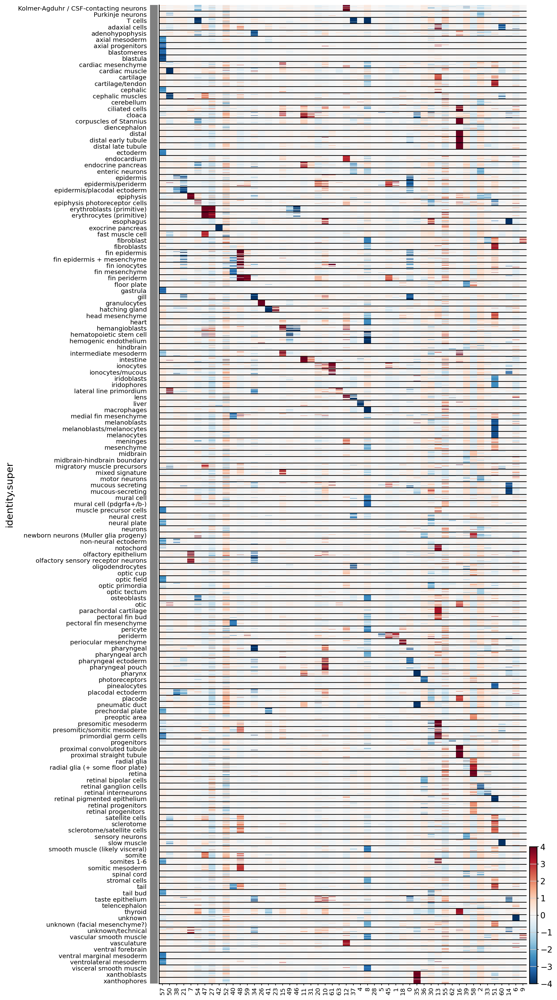

128 Dimensional


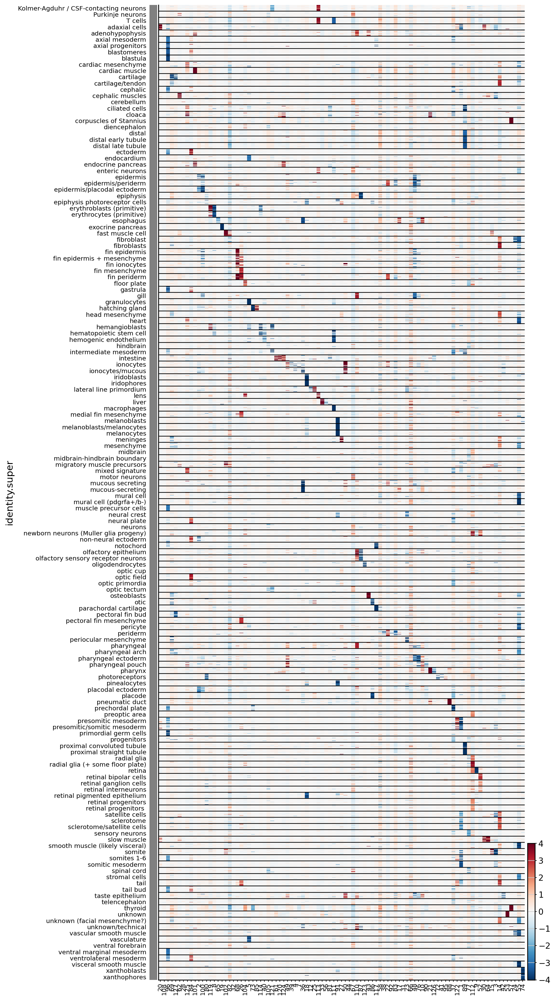

256 Dimensional


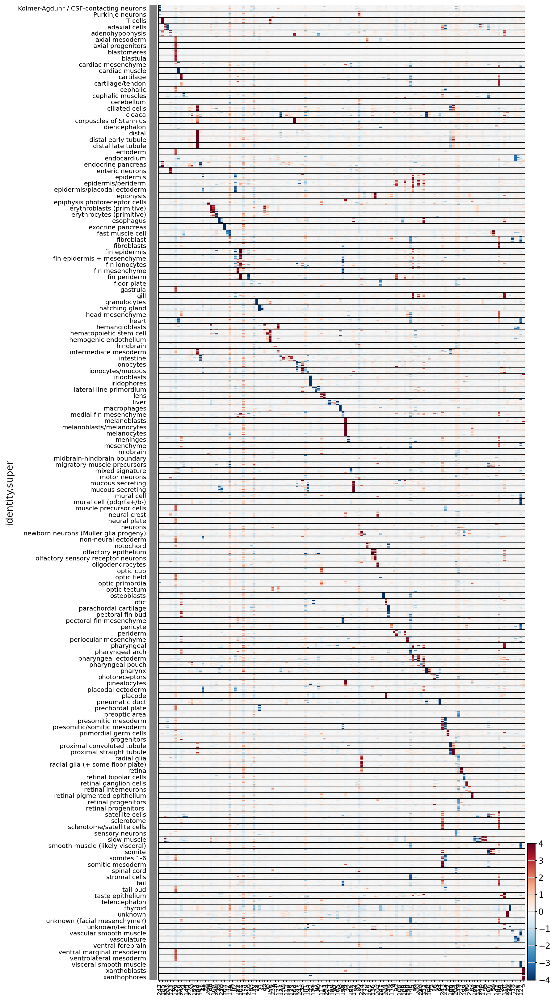

512 Dimensional


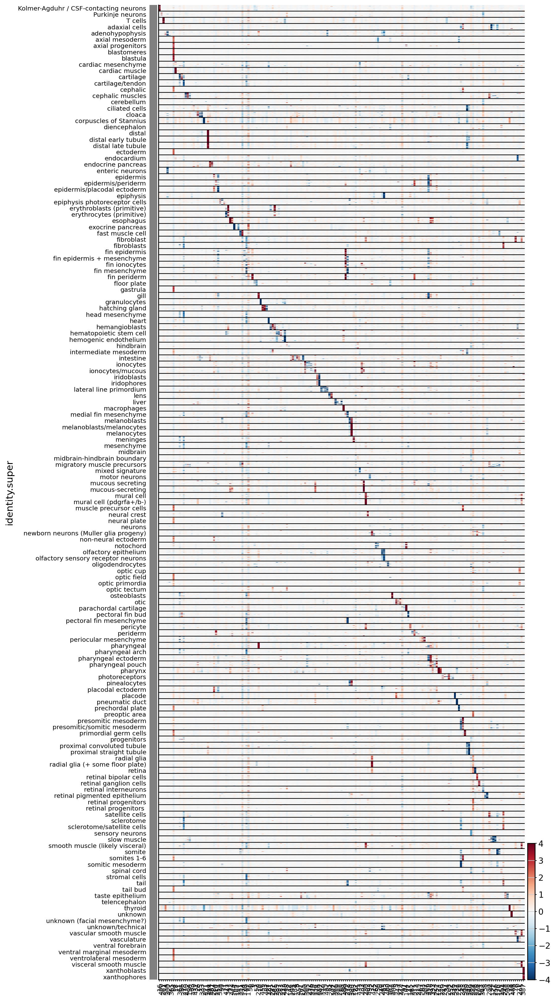

1024 Dimensional


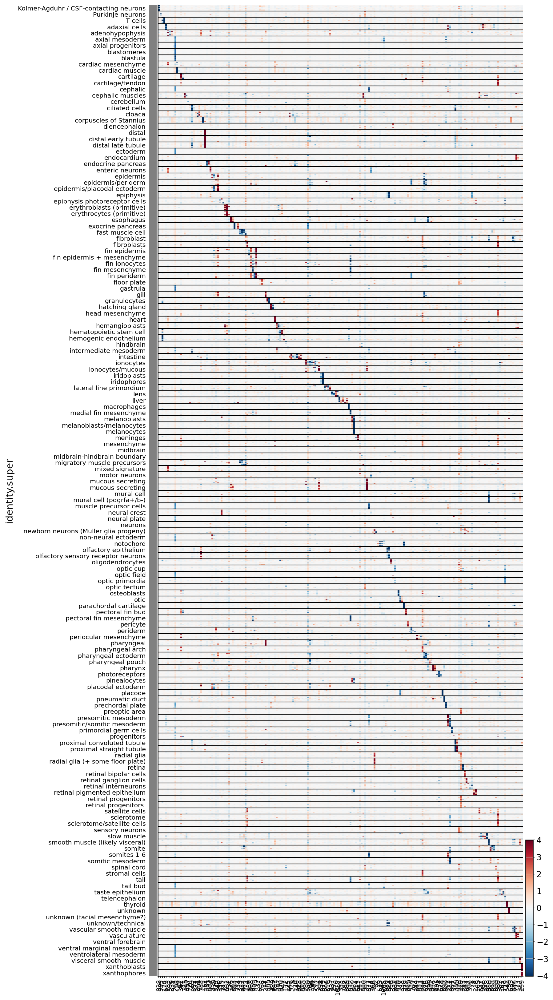

2048 Dimensional


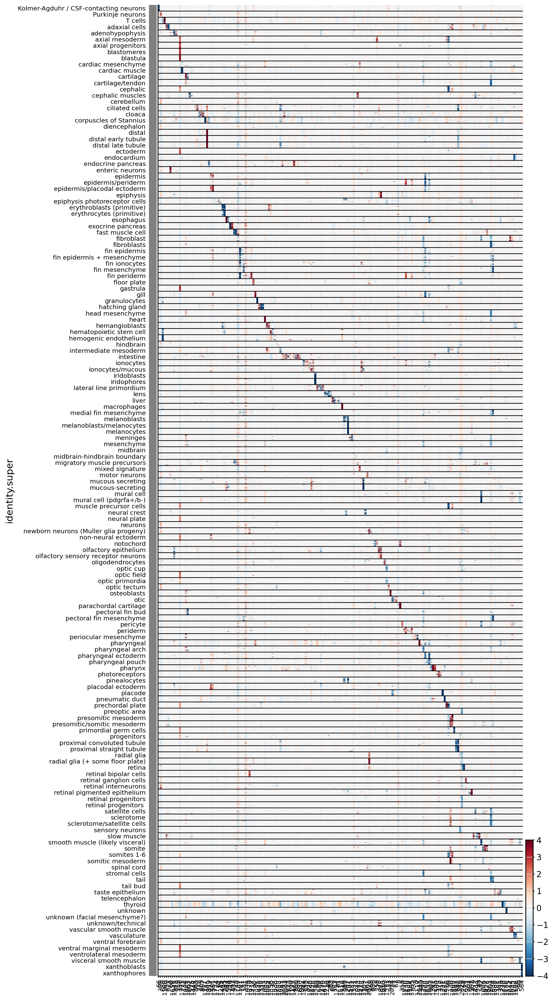

In [16]:
for method_name, embed in embeds.items():
    print(method_name)
    k = cell_type_key
    non_vanished_vars = np.arange(embed.n_vars)[np.abs(embed.X).max(axis=0) >= 0.1]
    embed_balanced = make_balanced_subsample(embed, k)
    dim_order = np.abs(embed_balanced.X).argmax(axis=0).argsort().tolist()
    sc.pl.heatmap(
        embed_balanced,
        embed.var.iloc[[x for x in dim_order if x in non_vanished_vars]].index,
        k,
        layer=None,
        figsize=(10, len(embed.obs[k].unique()) / 6),
        var_group_rotation=45,
        show_gene_labels=True,
        dendrogram=False,
        vcenter=0, vmin=-4, vmax=4,
        cmap='RdBu_r',
        show=False,
    )
    
    plt.savefig(proj_dir / 'plots' / 'zebrafish_ablation_hvg' / f'heatmap_of_non_vanished_dims_{k}_{method_name}.pdf', bbox_inches='tight')
    plt.show()

# Number of vanished dimensions

32 Dimensional


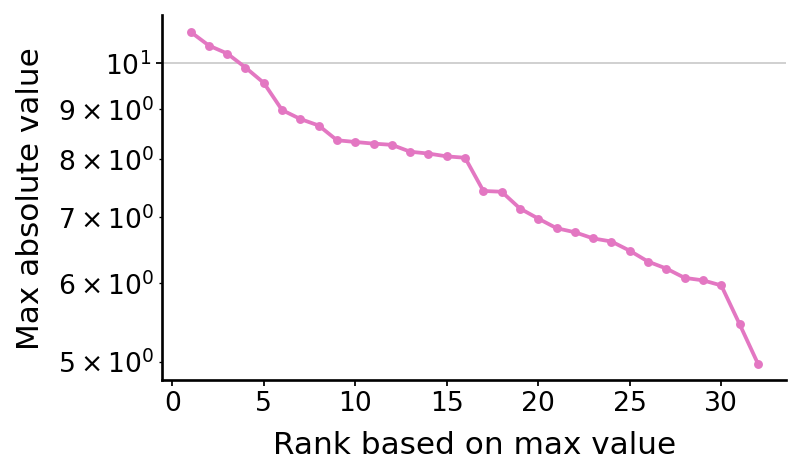

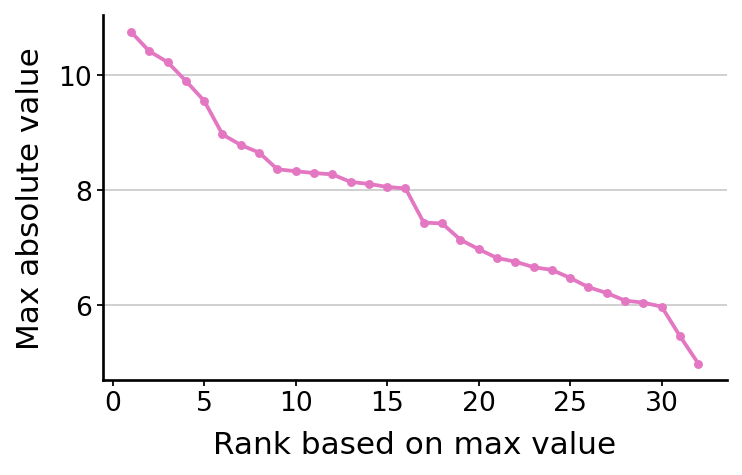

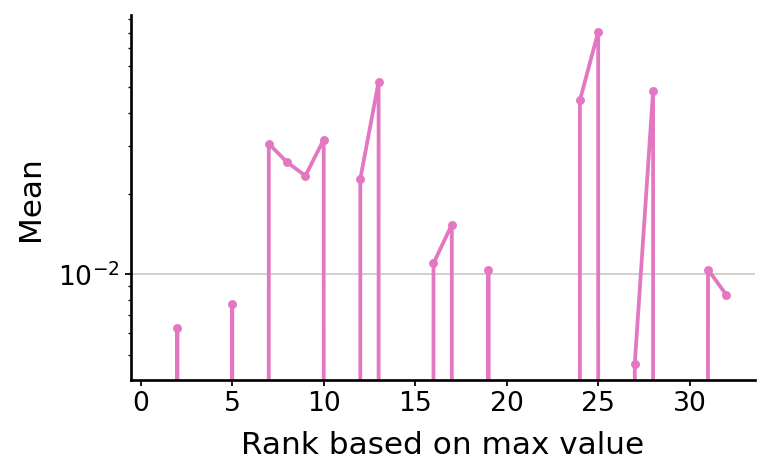

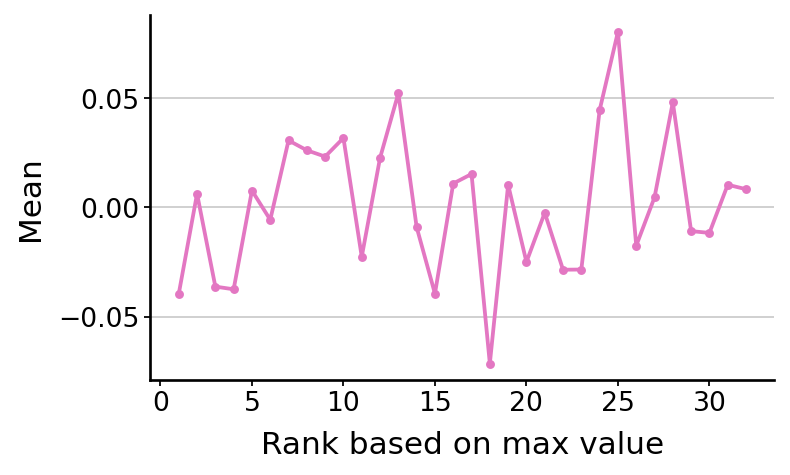

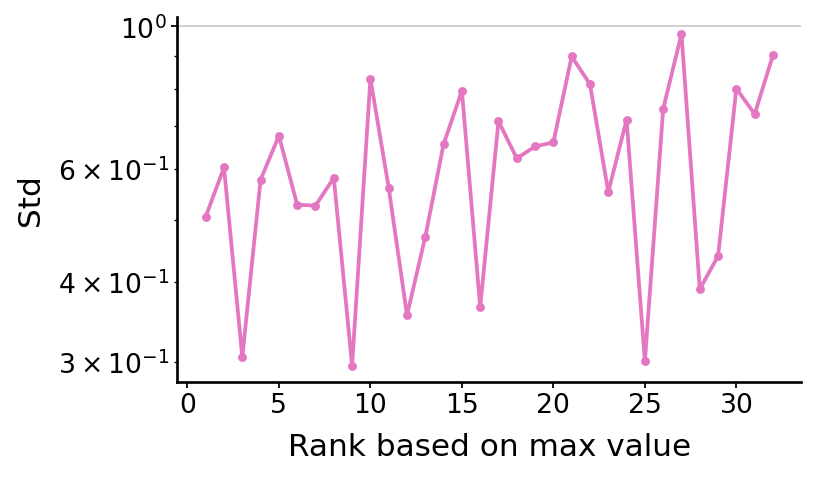

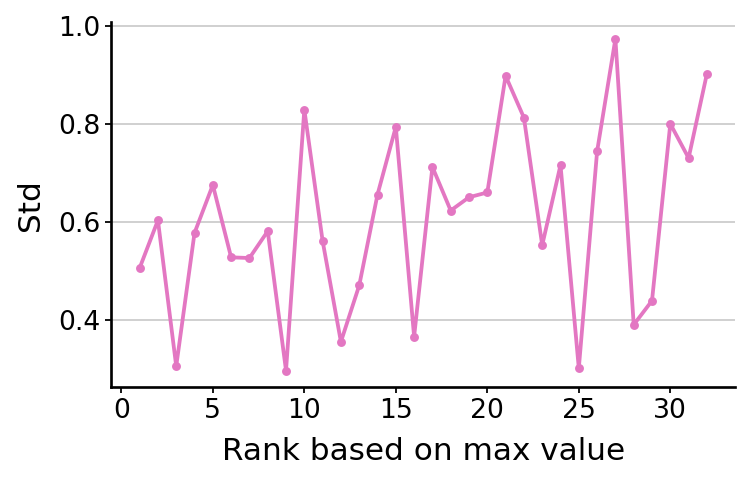

64 Dimensional


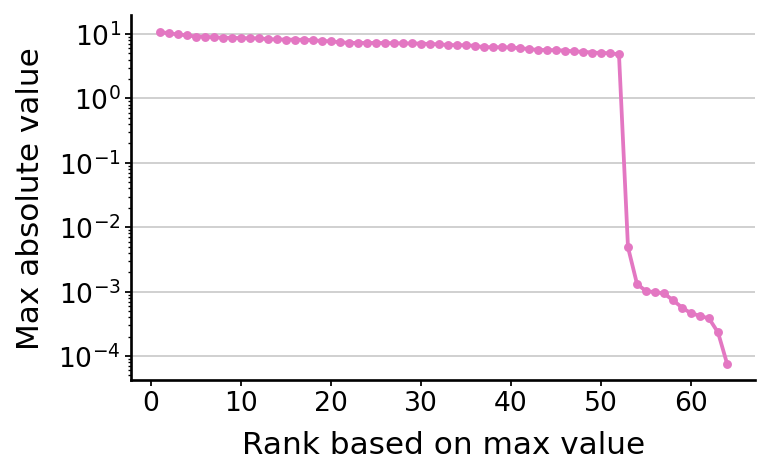

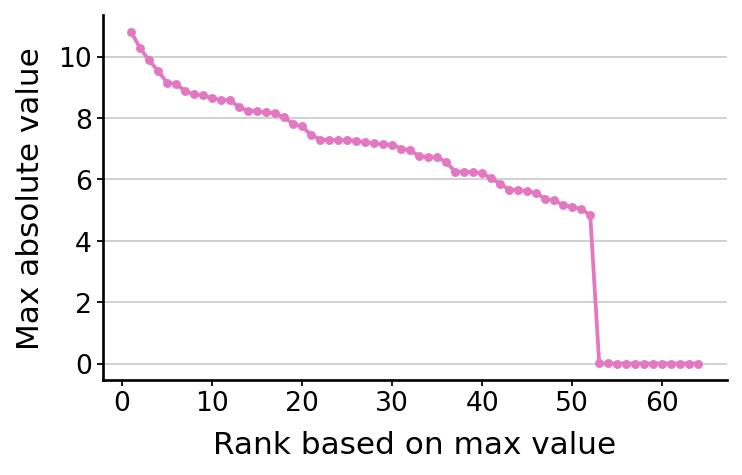

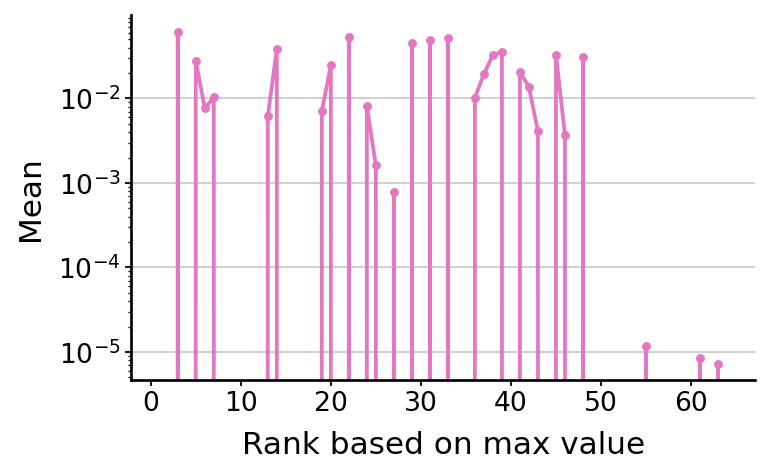

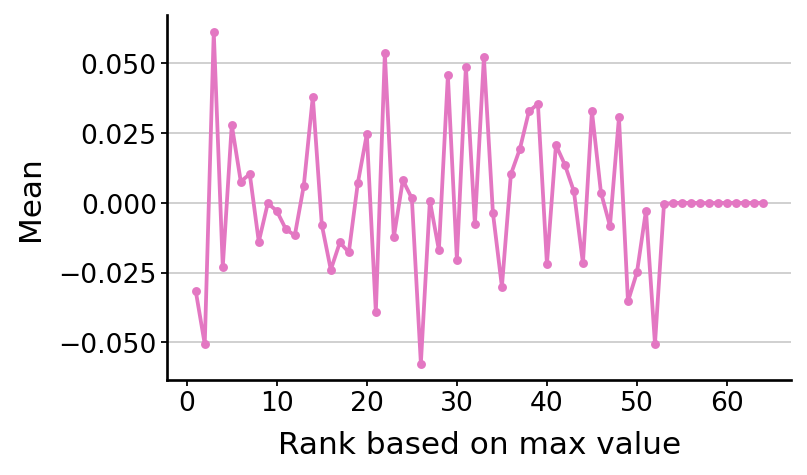

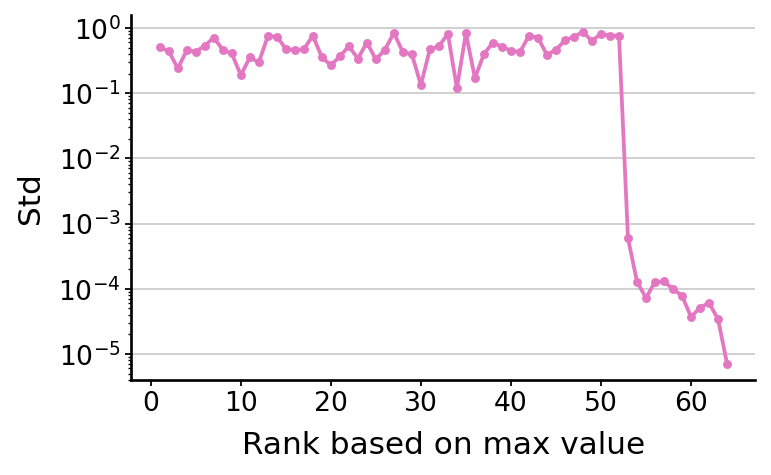

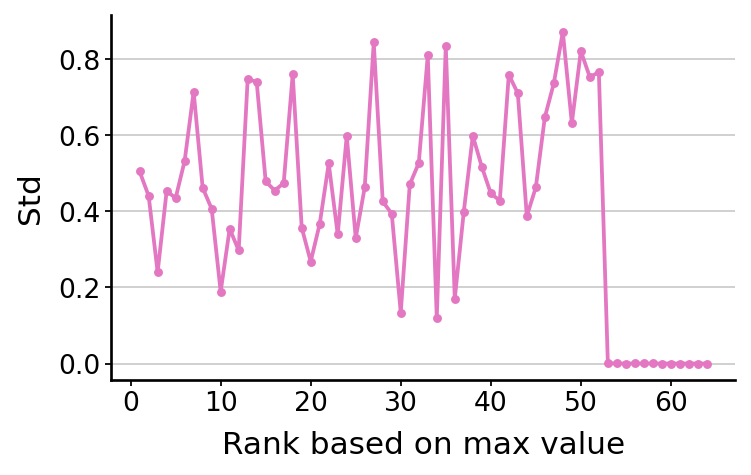

128 Dimensional


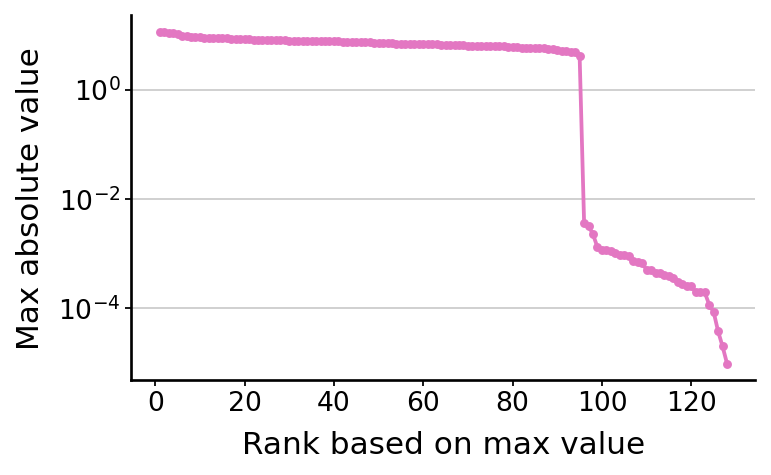

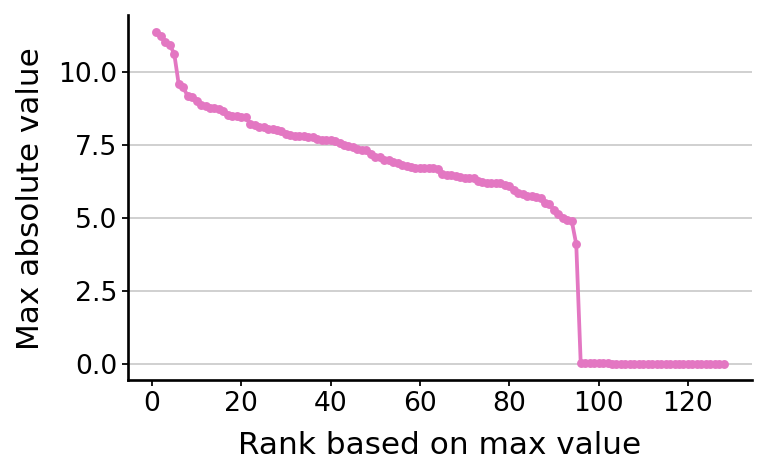

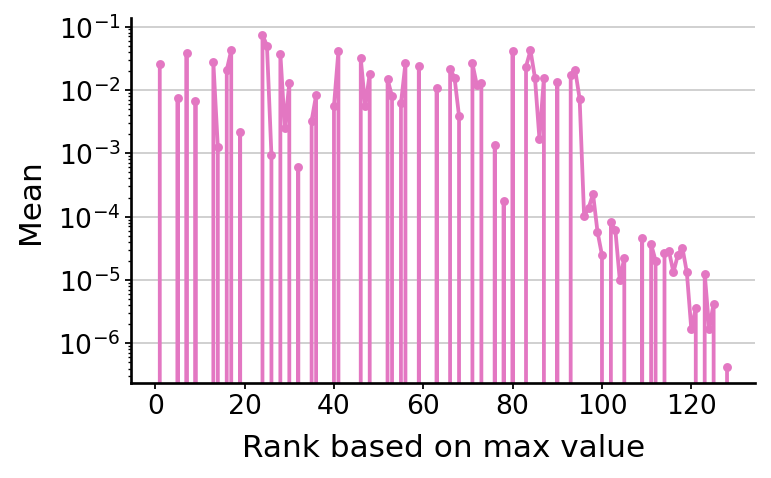

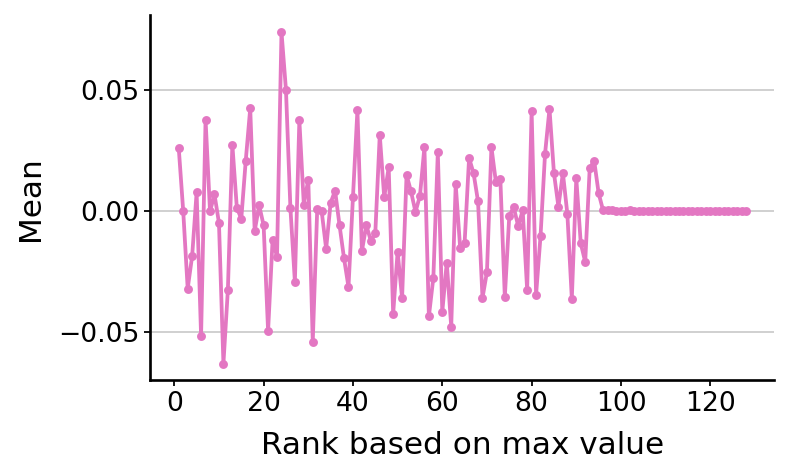

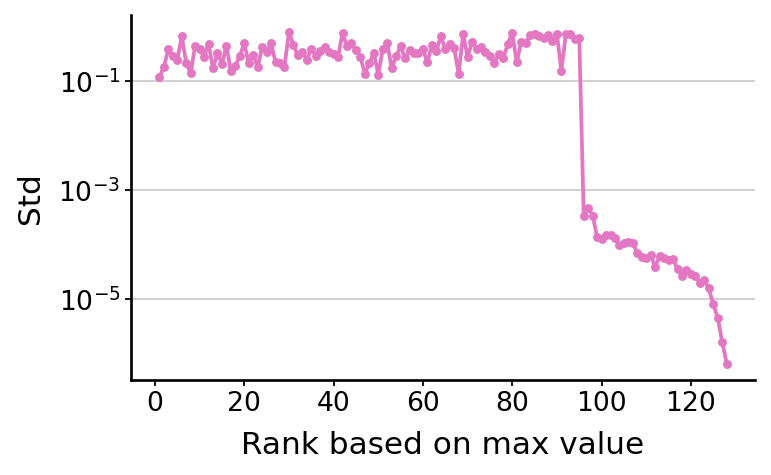

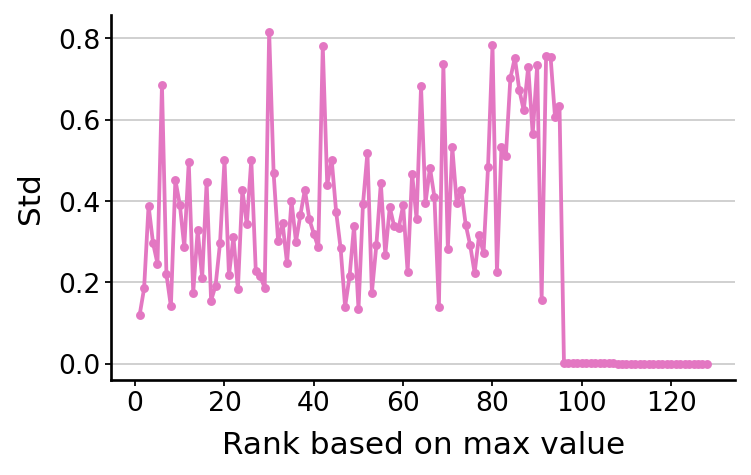

256 Dimensional


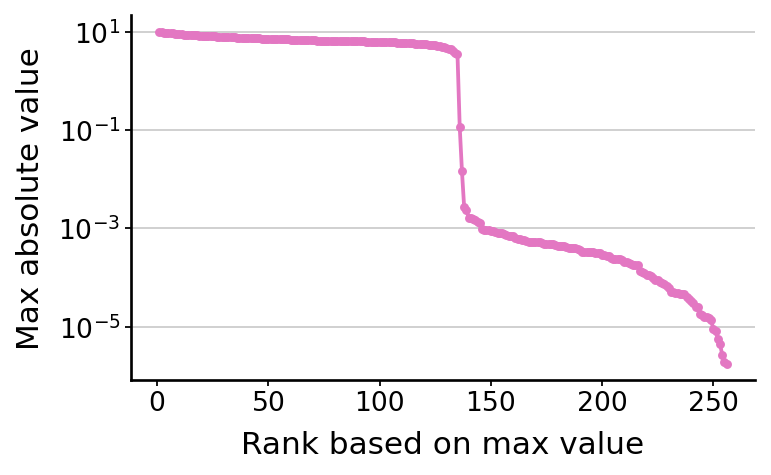

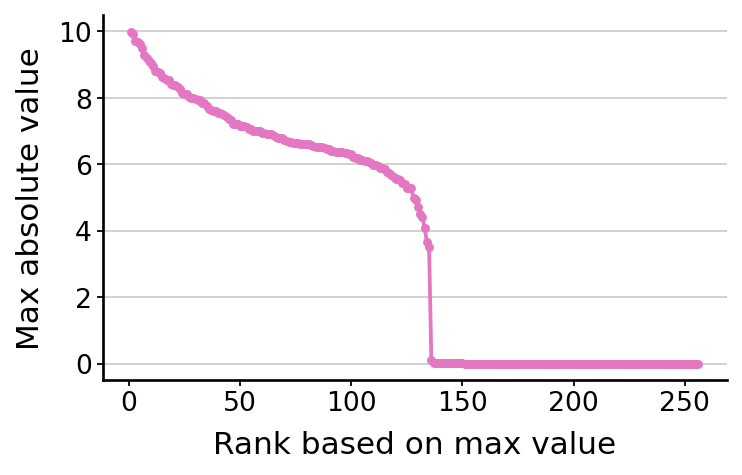

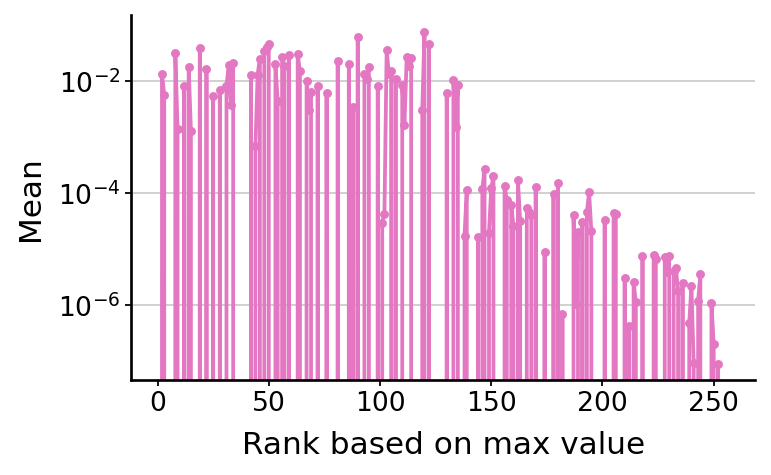

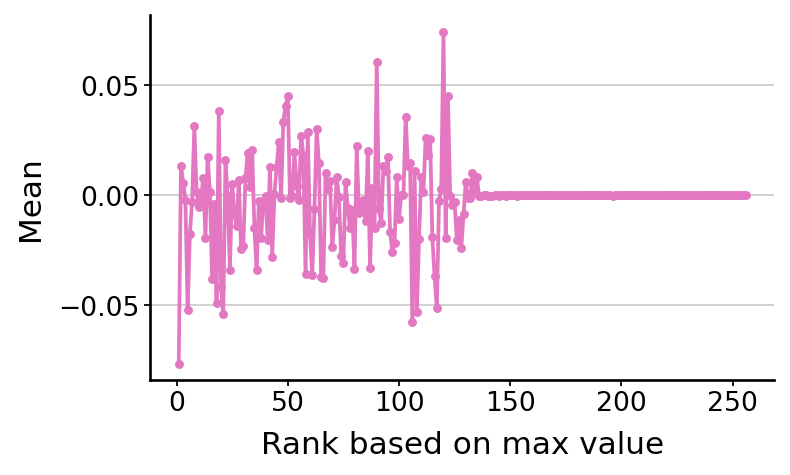

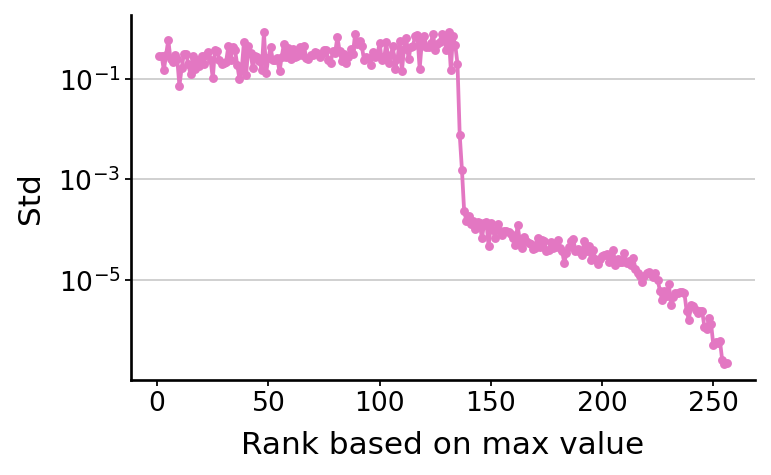

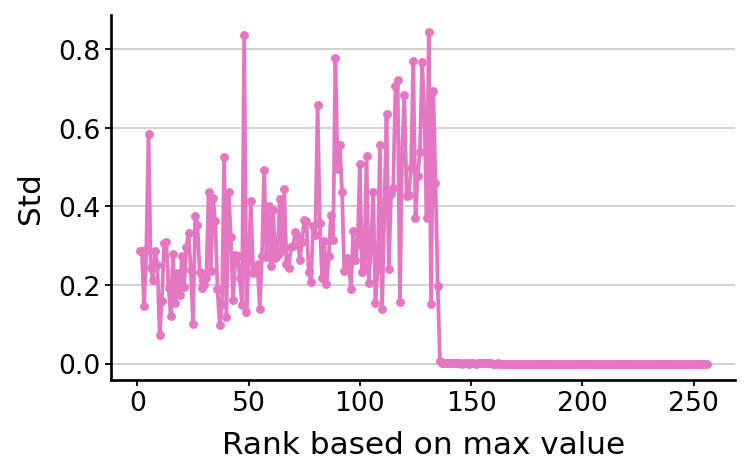

512 Dimensional


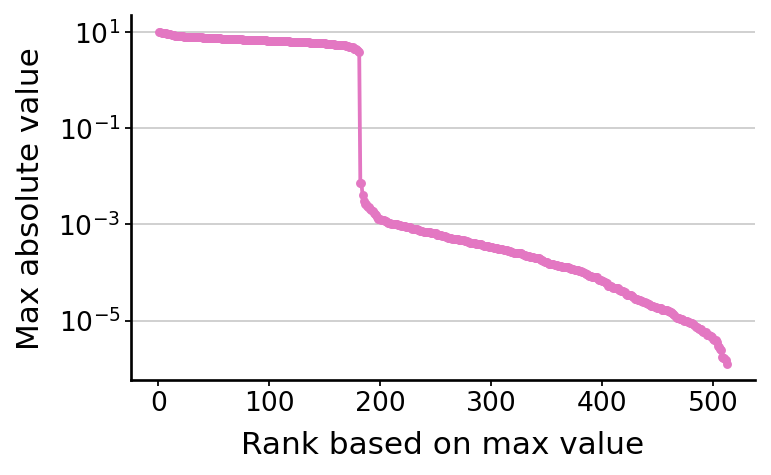

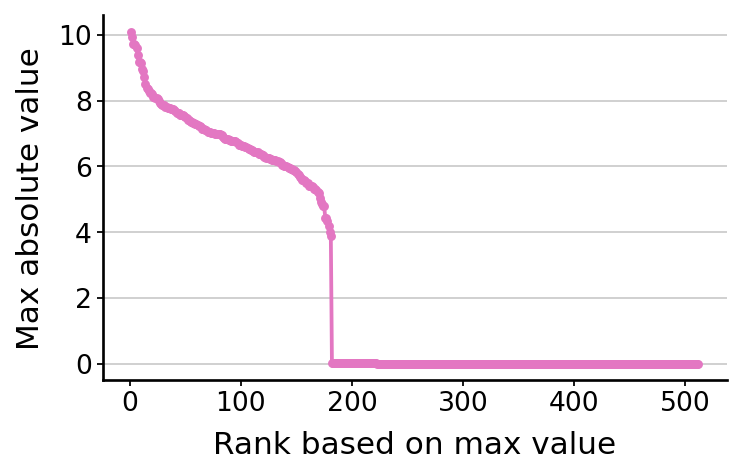

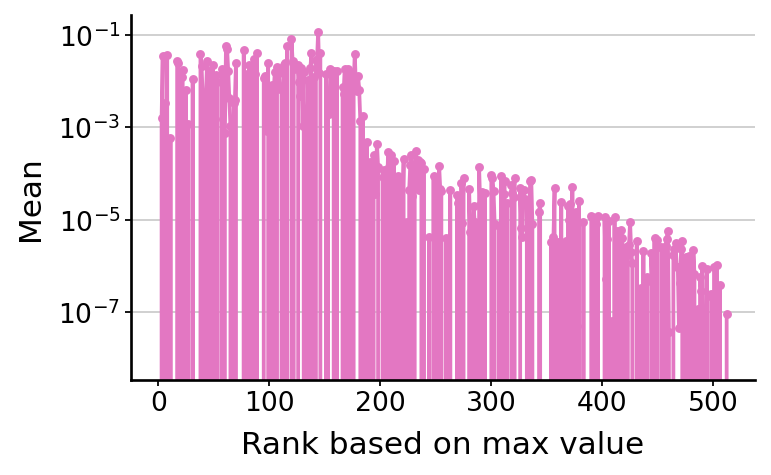

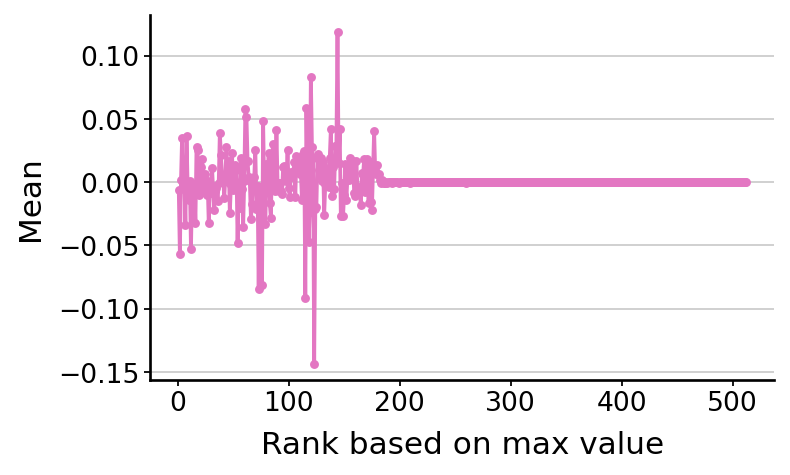

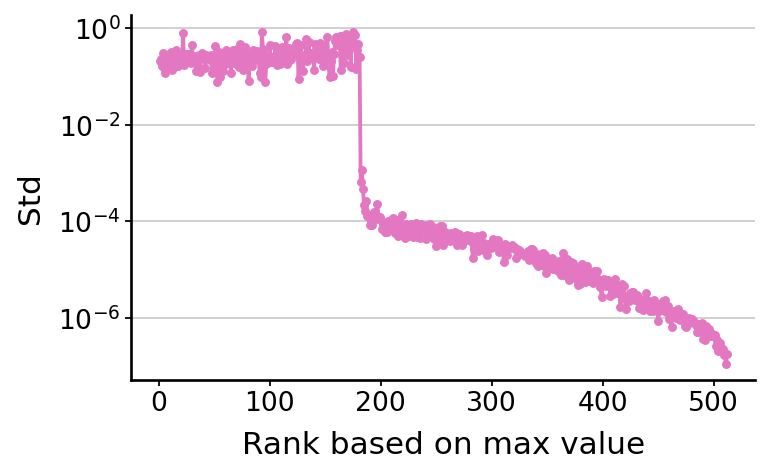

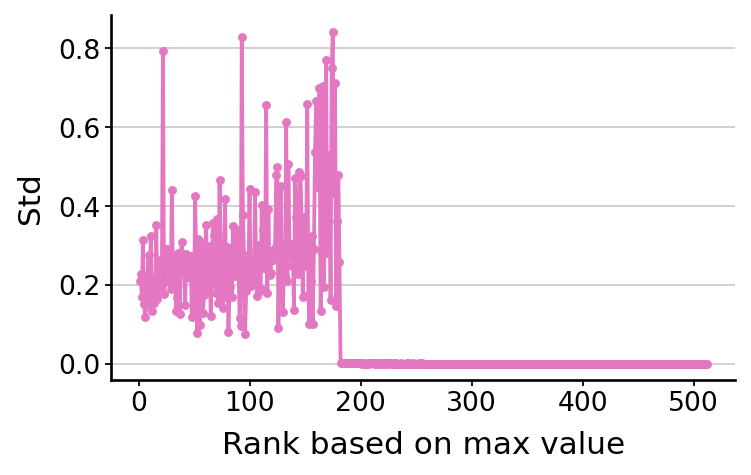

1024 Dimensional


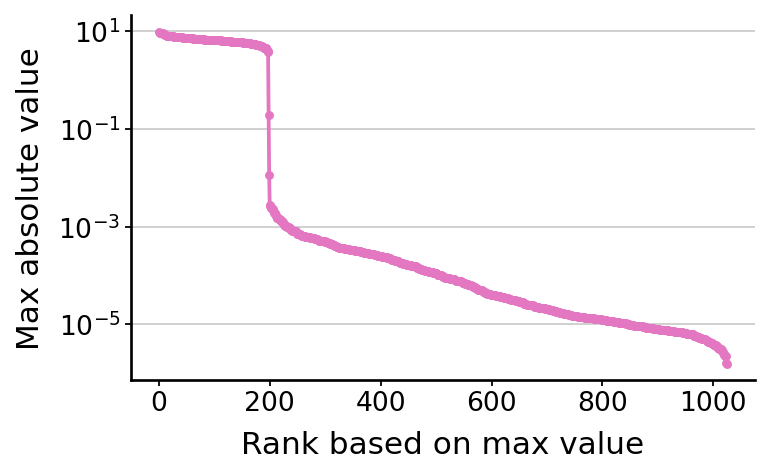

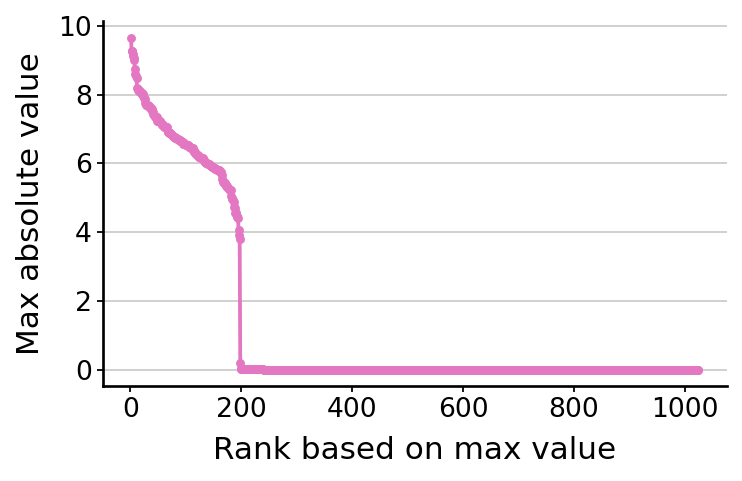

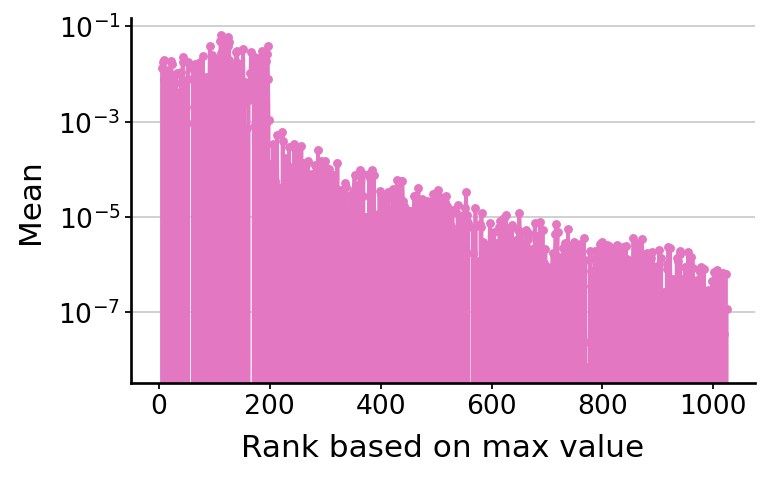

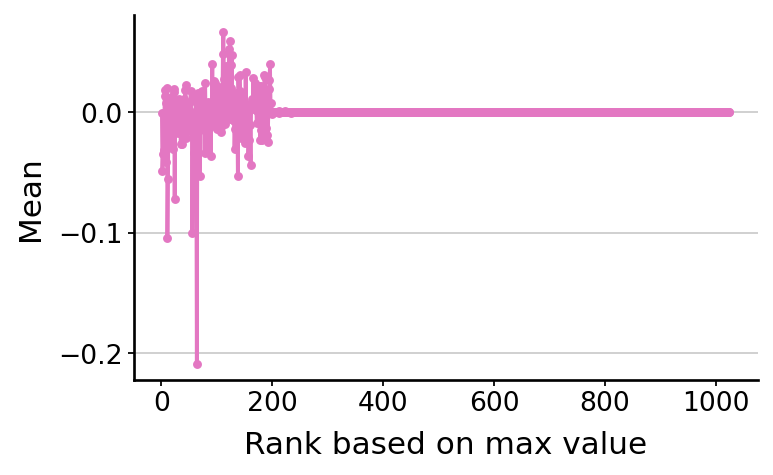

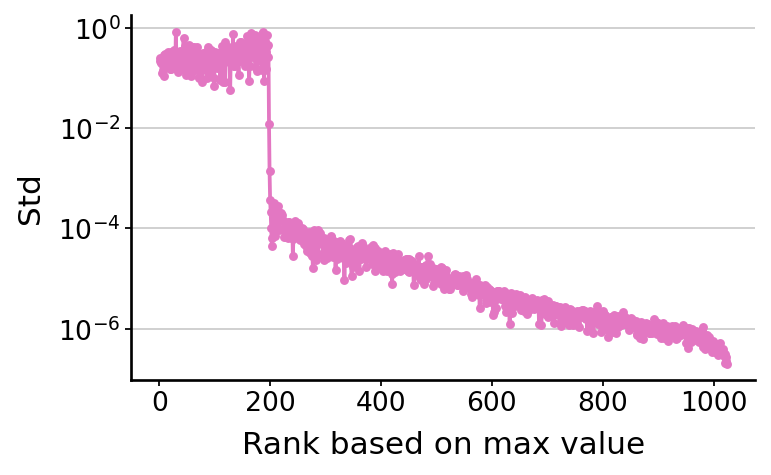

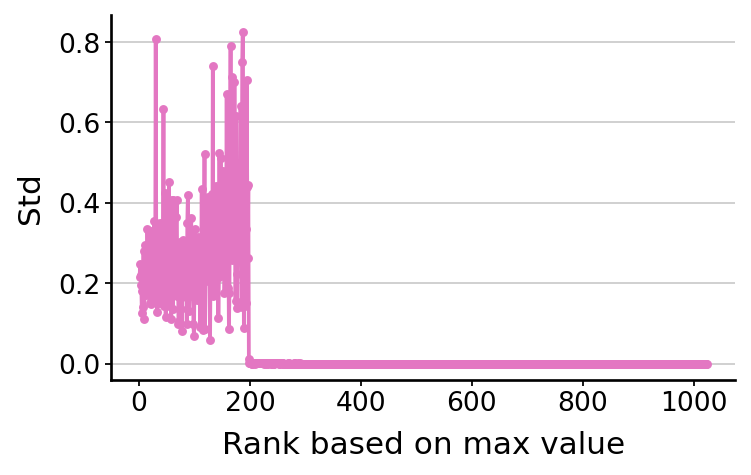

2048 Dimensional


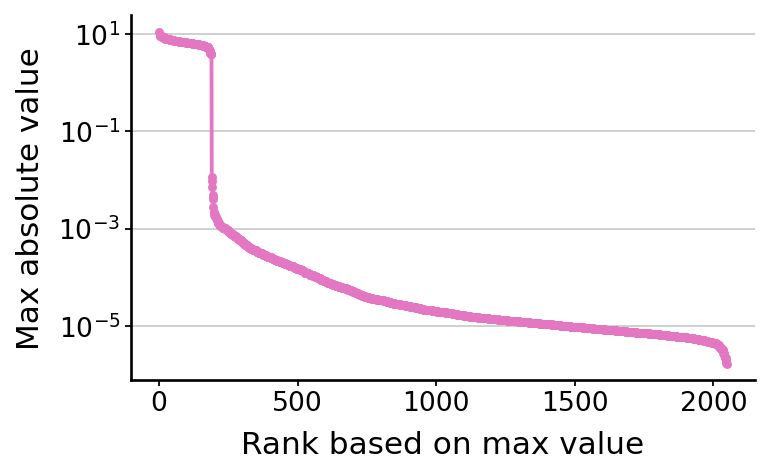

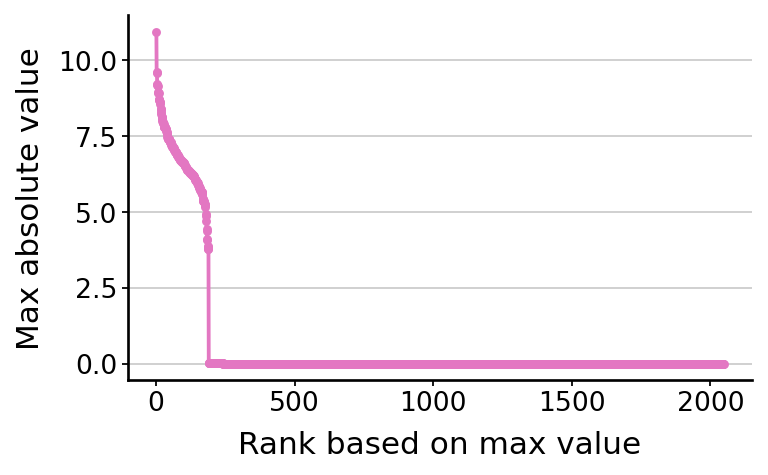

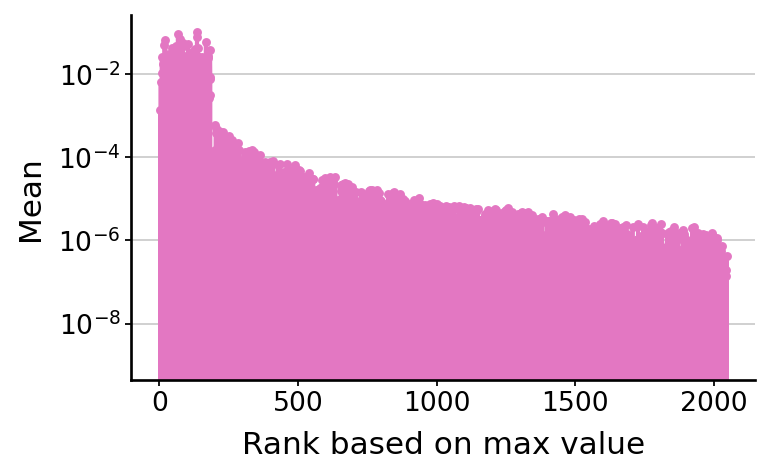

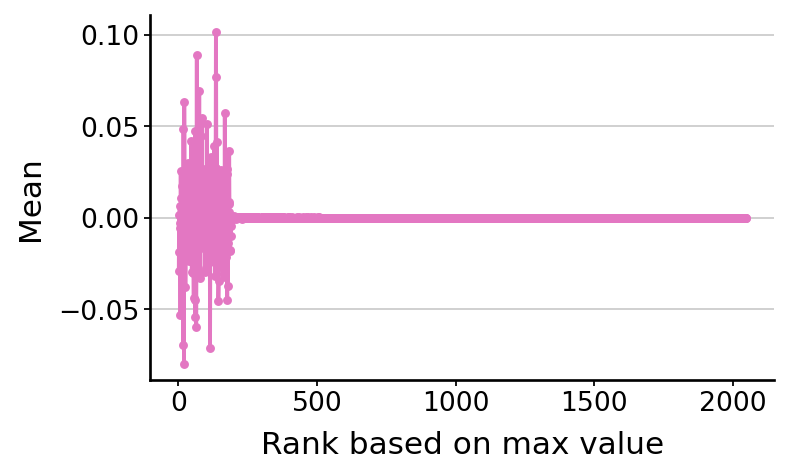

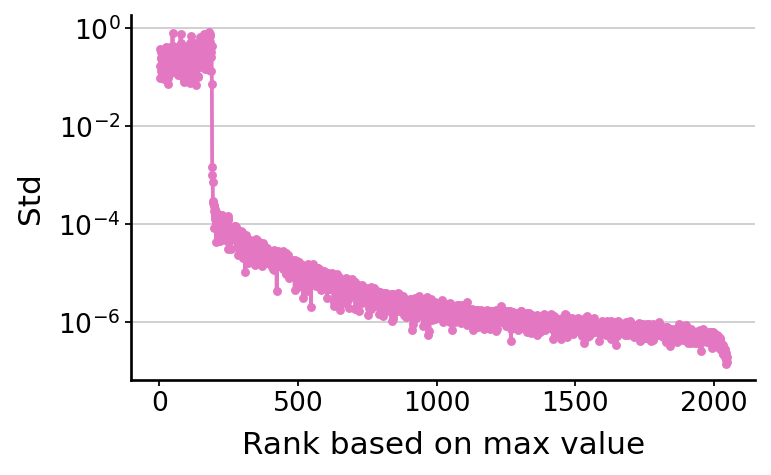

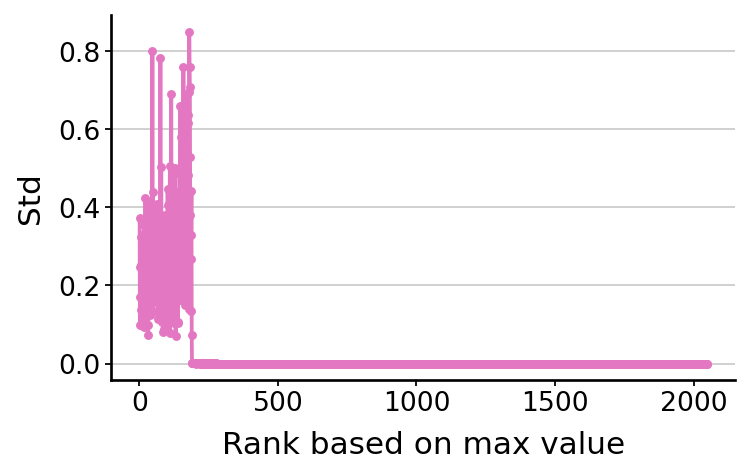

In [16]:
for method_name, embed in embeds.items():
    print(method_name)
    order = np.argsort(np.abs(embed.X).max(axis=0))[::-1]
    max_value_array = np.abs(embed.X).max(axis=0)[order]
    mean_array = embed.X.mean(axis=0)[order]
    std_array = embed.X.std(axis=0)[order]
    ranks = np.arange(1, embed.n_vars + 1)
    
    for y_axis_title, x in [
        ("Max absolute value", max_value_array),
        ("Mean", mean_array),
        ("Std", std_array),
    ]:
        for is_log in [True, False]:
            # Plotting the data
            plt.figure(figsize=(5, 3))
            plt.plot(ranks, x, 'o', markersize=3, color='#E377C2', label='Data Points')  # Plot points
            plt.plot(ranks, x, linestyle='-', color='#E377C2', label='Line')  # Solid line plot
        
            # Adding labels and title
            plt.xlabel('Rank based on max value')
            if is_log:
                plt.yscale('log')
            plt.ylabel(y_axis_title)
            
            # Adding a legend
            plt.legend().remove()
            
            # Displaying the plot
            plt.grid(axis='x')
            plt.savefig(proj_dir / 'plots' / 'zebrafish_ablation_hvg' / f'variable_vs_rank_based_on_max_{y_axis_title}{"_log" if is_log else ""}_{method_name}.pdf', bbox_inches='tight')
            plt.show()

In [17]:
def plot_based_on_n_latent(main_df, metric, metric_title, zero_center=True):
    # Plotting the data with specific x-axis labels
    plt.figure(figsize=(5, 3))
    split_point = 300, 150
    strech_factor = 5

    xticks_labels = []
    xticks_values = []
    for i, df in enumerate([main_df.query(f"n_latent < {split_point[0]}"), main_df.query(f"n_latent >= {split_point[1]}")]):
        x = df['n_latent']
        if i == 1:
            x = split_point[0] + (x - split_point[0]) / strech_factor
        plt.plot(x, df[metric], 'o', markersize=6, color='#E377C2')  # Plot points
        plt.plot(x, df[metric], linestyle='--', color='#E377C2')  # Dotted line plot
        
        # Setting labels and title
        plt.xlabel('Number of latent dimensions')
        plt.ylabel(metric_title)
    
        for i, val, label in zip(range(len(x)), x, df['n_latent']):
            if True:
                xticks_values.append(val)
                xticks_labels.append(str(label))
    
    # Customizing x-axis ticks to show only some of the values in n_latent
    plt.xticks(xticks_values, xticks_labels, rotation=90)
    if zero_center:
        plt.ylim(ymin=0)
    
    # Adding vertical dotted lines for each n_latent value
    for val in xticks_values:
        plt.axvline(x=val, linestyle=':', color='grey', zorder=-10)
    
    # Add splitting lines
    plt.axvline(x=270, linestyle='-', color='black')
    plt.axvline(x=280, linestyle='-', color='black')
    
    # Displaying the plot
    plt.grid(False)
    return plt

In [18]:
embed_names_list = list(embeds.keys())
plot_df = pd.DataFrame(
    {
        'n_latent': [int(x.split(" ")[0]) for x in embed_names_list],
        'n_non_vanished': [(np.abs(embeds[x].X).max(axis=0) > 1).sum() for x in embed_names_list],
    }
)
plot_df.T

,0,1,2,3,4,5,6
n_latent,32,64,128,256,512,1024,2048
n_non_vanished,32,52,95,135,181,197,189


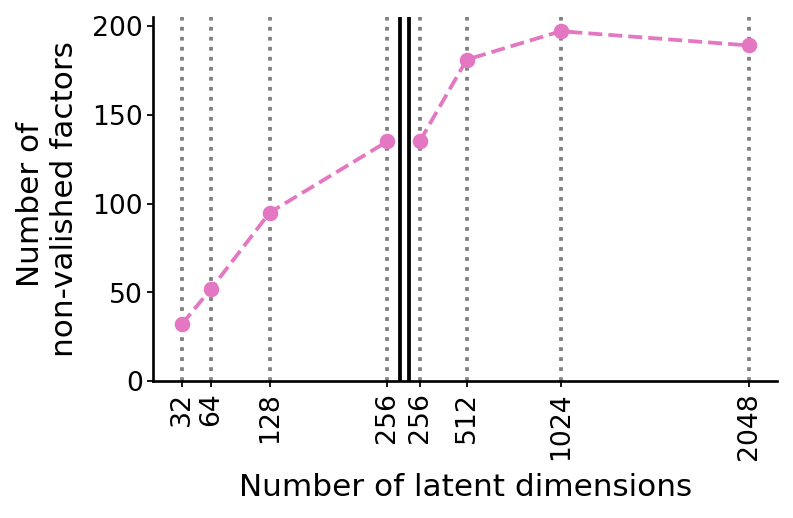

In [19]:
metric = 'n_non_vanished'
plt = plot_based_on_n_latent(plot_df.copy(), metric, 'Number of \nnon-valished factors')
plt.savefig(proj_dir / 'plots' / 'zebrafish_ablation_hvg' / f'{metric}_vs_n_latent.pdf', bbox_inches='tight')
plt.show()

# Disentanglement comparison

In [22]:
######################################
# Please run disentanglemnt notebook #
######################################

In [23]:
disentanglement_results_df = pd.read_csv(proj_dir / 'results' / f'eval_disentanglement_zebrafish_hvg_ablation_all.csv', index_col=0)
disentanglement_results_df

,Method,LMS-SMI-disc,LMS-SPN,LMS-ASC,MSAS-SMI-disc,MSAS-SPN,MSAS-ASC,MSGS-SMI-disc,MSGS-SPN,MSGS-ASC
0,32 Dimensional,0.143379,0.127336,0.032382,0.515556,0.305478,0.092142,0.324157,0.246897,0.024201
1,64 Dimensional,0.242457,0.178823,0.051824,0.534689,0.317188,0.093500,0.256452,0.224031,0.015769
2,128 Dimensional,0.364787,0.247451,0.077748,0.548161,0.335266,0.093263,0.234010,0.216770,0.011631
3,256 Dimensional,0.482095,0.326285,0.088709,0.577762,0.371360,0.094298,0.201003,0.180982,0.009170
4,512 Dimensional,0.528068,0.358588,0.091707,0.588508,0.390517,0.094461,0.147404,0.134528,0.006675
5,1024 Dimensional,0.483152,0.354208,0.083590,0.588665,0.395252,0.092958,0.221736,0.202801,0.015568
6,2048 Dimensional,0.472151,0.346084,0.082614,0.590400,0.392013,0.093687,0.246152,0.223777,0.016941


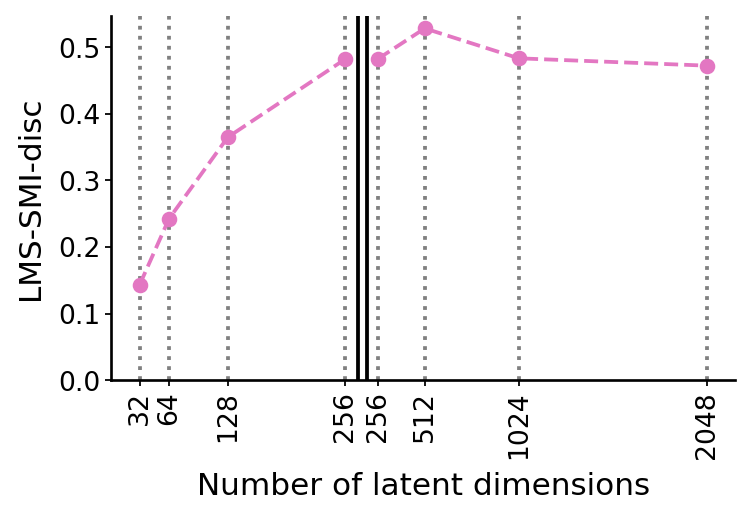

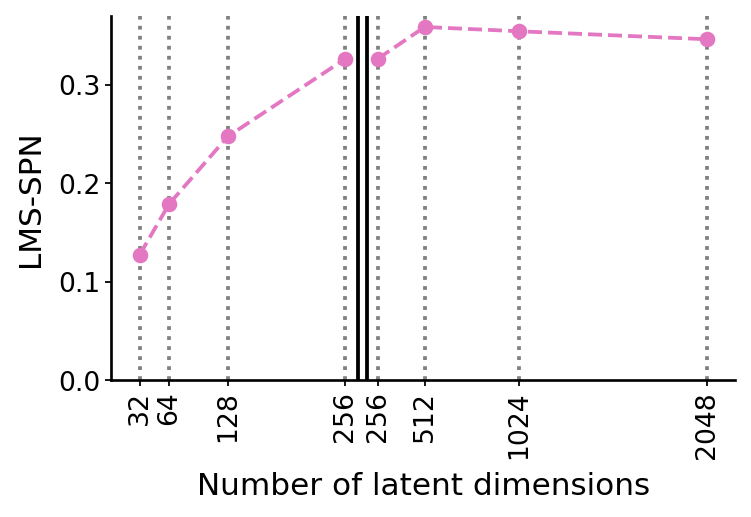

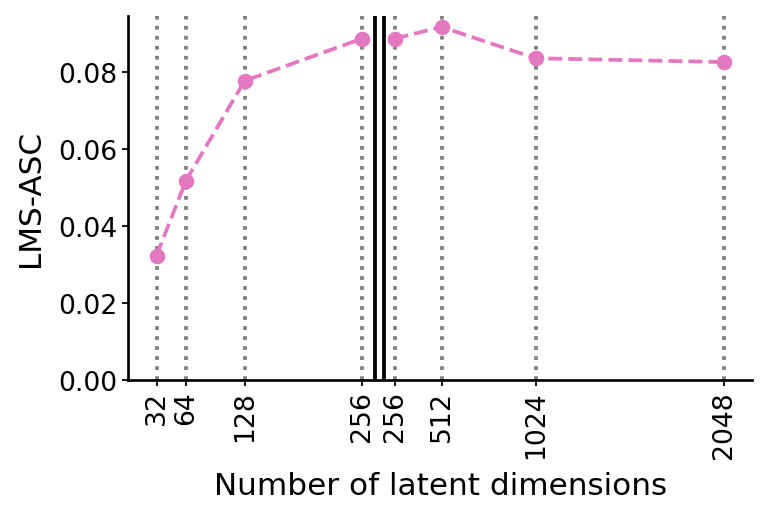

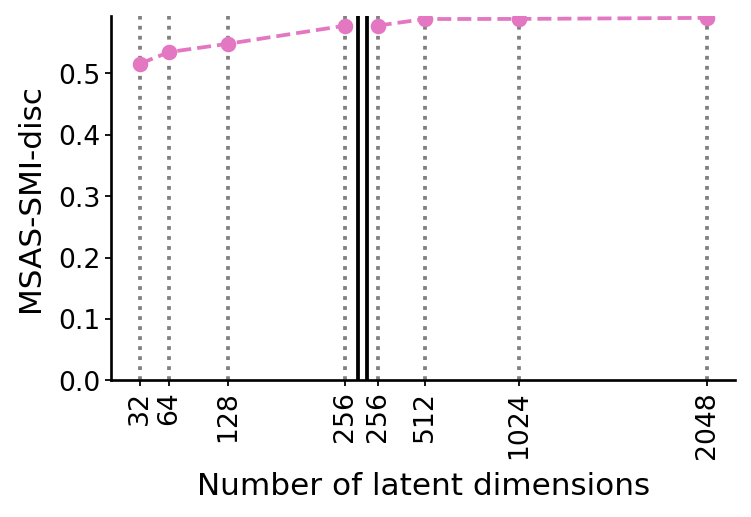

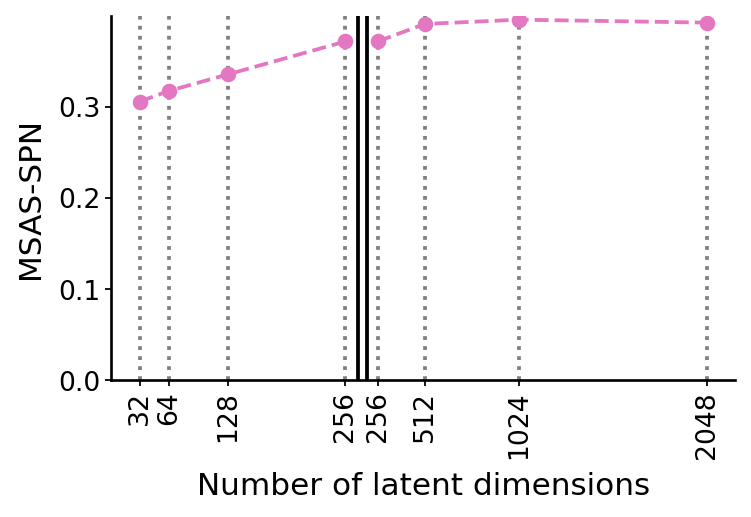

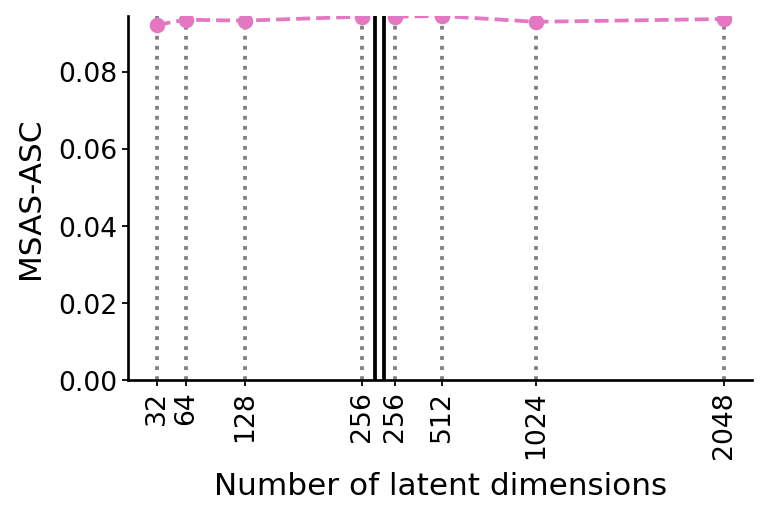

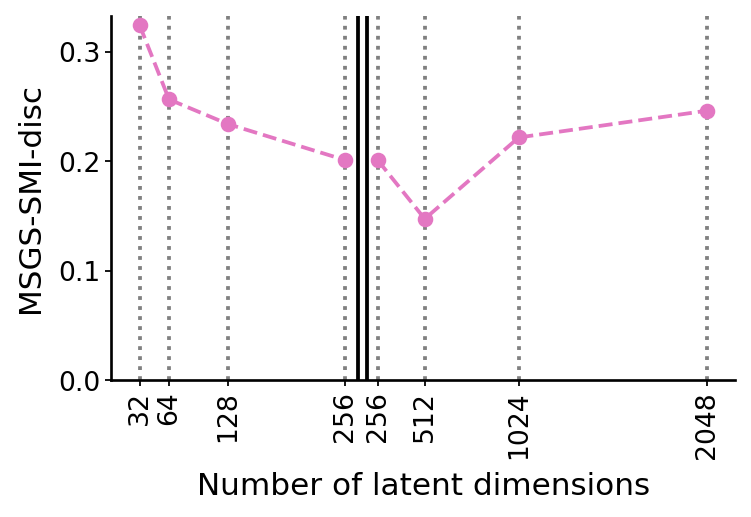

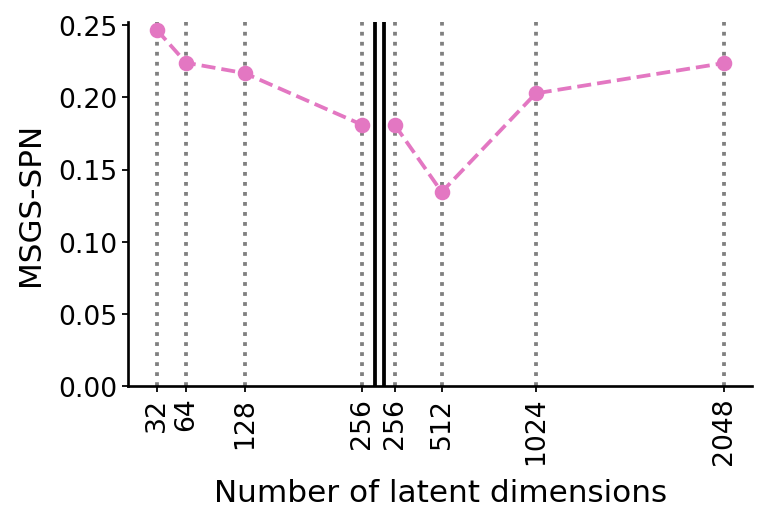

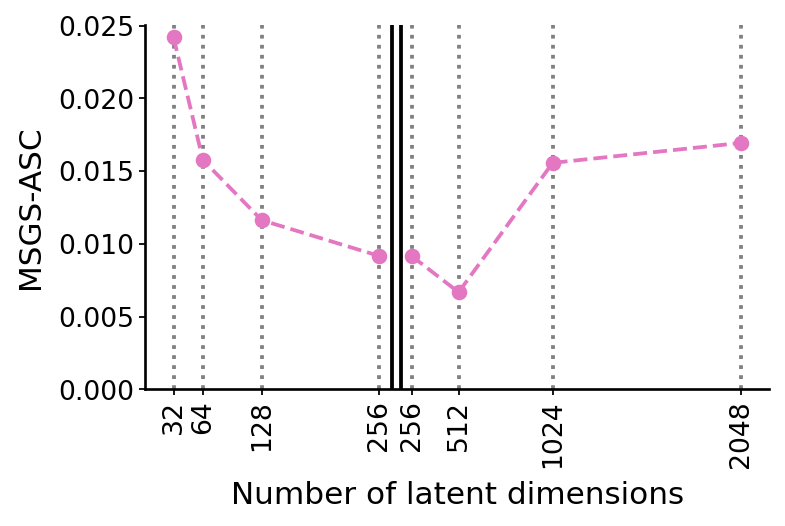

In [24]:
df = disentanglement_results_df.copy()
df['n_latent'] = df['Method'].str.split(" ").str[0].astype(int)
df
for metric in df.columns:
    if "-" not in metric:
        continue

    plt = plot_based_on_n_latent(df.copy(), metric, metric)
    plt.savefig(proj_dir / 'plots' / 'immune_ablation' / f'{metric}_vs_n_latent.pdf', bbox_inches='tight')
    plt.show()